** Image Reverse search engine using Caltech101(Dataset) and Caltech256(Datasets), They have 101 and 256 categery of images with 40 to 800 images per categery, from Caltech101 102nd of categery data is of 'BACKGROUND_Google', which need to be removed.


**bold text**
Getting Data sets from Caltech, Which is can be found in GOOGLE drive: link = 
! gdown https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp--output caltech101.tar.gz. 

From The Below command we download the approx of 9000 images with 101 categery

"tar" command used for Careting Archive and Extract The archive files

In [1]:
!mkdir -p datasets/practice_project
!pip install gdown
!gdown https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp --output datasets/practice_project/caltech101.tar.gz
!tar -xvzf datasets/practice_project/caltech101.tar.gz --directory datasets/practice_project
!mv datasets/practice_project/101_ObjectCategories datasets/practice_project/caltech101
!rm -rf datasets/practice_project/caltech101/BACKGROUND_Google

Streaming output truncated to the last 5000 lines.
101_ObjectCategories/chair/image_0005.jpg
101_ObjectCategories/chair/image_0006.jpg
101_ObjectCategories/chair/image_0007.jpg
101_ObjectCategories/chair/image_0008.jpg
101_ObjectCategories/chair/image_0010.jpg
101_ObjectCategories/chair/image_0011.jpg
101_ObjectCategories/chair/image_0012.jpg
101_ObjectCategories/chair/image_0013.jpg
101_ObjectCategories/chair/image_0014.jpg
101_ObjectCategories/chair/image_0016.jpg
101_ObjectCategories/chair/image_0017.jpg
101_ObjectCategories/chair/image_0018.jpg
101_ObjectCategories/chair/image_0019.jpg
101_ObjectCategories/chair/image_0020.jpg
101_ObjectCategories/chair/image_0022.jpg
101_ObjectCategories/chair/image_0023.jpg
101_ObjectCategories/chair/image_0024.jpg
101_ObjectCategories/chair/image_0025.jpg
101_ObjectCategories/chair/image_0026.jpg
101_ObjectCategories/chair/image_0028.jpg
101_ObjectCategories/chair/image_0029.jpg
101_ObjectCategories/chair/image_0030.jpg
101_ObjectCategories/chai

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
from numpy.linalg import norm
import _pickle as pickle
from tqdm import tqdm, tqdm_notebook
import os
import random
import time
import math
import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, GlobalAveragePooling2D

In [4]:
def model_picker(name):
    if (name == 'vgg16'):
        model = VGG16(weights='imagenet',
                      include_top=False,
                      input_shape=(224, 224, 3),
                      pooling='max')
    elif (name == 'vgg19'):
        model = VGG19(weights='imagenet',
                      include_top=False,
                      input_shape=(224, 224, 3),
                      pooling='max')
    elif (name == 'mobilenet'):
        model = MobileNet(weights='imagenet',
                          include_top=False,
                          input_shape=(224, 224, 3),
                          pooling='max',
                          depth_multiplier=1,
                          alpha=1)
    elif (name == 'inception'):
        model = InceptionV3(weights='imagenet',
                            include_top=False,
                            input_shape=(224, 224, 3),
                            pooling='max')
    elif (name == 'resnet'):
        model = ResNet50(weights='imagenet',
                         include_top=False,
                         input_shape=(224, 224, 3),
                        pooling='max')
    elif (name == 'xception'):
        model = Xception(weights='imagenet',
                         include_top=False,
                         input_shape=(224, 224, 3),
                         pooling='max')
    else:
        print("Specified model not available")
    return model

In [6]:
model_architecture = 'resnet'
model = model_picker(model_architecture)

94781440/94765736 [==============================] - 3s 0us/step


In [7]:
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path,
                         target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [8]:
try:
  import google.colab
  IS_COLAB_ENV = True
except:
  IS_COLAB_ENV = False

In [9]:
IMG_PATH = '../../sample-images/cat.jpg'
if IS_COLAB_ENV:
  !curl https://raw.githubusercontent.com/PracticalDL/Practical-Deep-Learning-Book/master/sample-images/cat.jpg --output cat.jpg
  IMG_PATH = 'cat.jpg'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  661k  100  661k    0     0  4864k      0 --:--:-- --:--:-- --:--:-- 4829k


In [10]:
features = extract_features('cat.jpg', model)
print("Total length of features for one image: ", len(features))

Total length of features for one image:  2048


In [11]:
%timeit features = extract_features('cat.jpg', model)

10 loops, best of 5: 133 ms per loop


In [12]:
extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']

def get_file_list(root_dir):
    file_list = []
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                filepath = os.path.join(root, filename)
                if os.path.exists(filepath):
                  file_list.append(filepath)
                else:
                  print(filepath)
    return file_list

In [13]:
# path to the your datasets
root_dir = 'datasets/practice_project/caltech101'
filenames = sorted(get_file_list(root_dir))
print(len(filenames))

8677


In [14]:
standard_feature_list = []
for i in tqdm_notebook(range(len(filenames))):
    standard_feature_list.append(extract_features(filenames[i], model))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/8677 [00:00<?, ?it/s]

In [15]:
batch_size = 128
datagen = tensorflow.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        class_mode=None,
                                        shuffle=False)

num_images = len(generator.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

start_time = time.time()
feature_list = []
feature_list = model.predict(generator, num_epochs)
end_time = time.time()

Found 8677 images belonging to 101 classes.


In [16]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(len(feature_list), -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

Num images   =  8677
Shape of feature_list =  (8677, 2048)
Time taken in sec =  61.34045076370239


In [17]:
filenames = [root_dir + '/' + s for s in generator.filenames]

In [18]:
!mkdir -p data

In [19]:
with open(r"./data/class_ids-caltech101.pickle","wb") as output_file1:
  pickle.dump(generator.classes, output_file1)
with open(r"./data/filenames-caltech101.pickle", "wb") as output_file2:
  pickle.dump(filenames, output_file2)
with open(r"./data/features-caltech101-" + model_architecture + ".pickle", "wb") as output_file3:
  pickle.dump(feature_list,output_file3)

In [20]:
TRAIN_SAMPLES = 8677
NUM_CLASSES = 101
IMG_WIDTH, IMG_HEIGHT = 224, 224

In [21]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   zoom_range=0.2)

In [22]:
train_generator = train_datagen.flow_from_directory(root_dir,
                                                    target_size=(IMG_WIDTH,
                                                                 IMG_HEIGHT),
                                                    shuffle=True,
                                                    seed=12345,
                                                    class_mode='categorical')

Found 8677 images belonging to 101 classes.


In [23]:
def model_maker():
    base_model = ResNet50(include_top=False,
                           input_shape=(IMG_WIDTH, IMG_HEIGHT, 3))
    for layer in base_model.layers[:]:
        layer.trainable = False
    input = Input(shape=(IMG_WIDTH, IMG_HEIGHT, 3))
    custom_model = base_model(input)
    custom_model = GlobalAveragePooling2D()(custom_model)
    custom_model = Dense(64, activation='relu')(custom_model)
    custom_model = Dropout(0.5)(custom_model)
    predictions = Dense(NUM_CLASSES, activation='softmax')(custom_model)
    return Model(inputs=input, outputs=predictions)

In [24]:
model_finetuned = model_maker()
model_finetuned.compile(loss='categorical_crossentropy',
              optimizer=tensorflow.keras.optimizers.Adam(0.001),
              metrics=['acc'])
model_finetuned.fit_generator(
    train_generator,
    steps_per_epoch=math.ceil(float(TRAIN_SAMPLES) / batch_size),
    epochs=10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/10
68/68 [==============================] - 36s 469ms/step - loss: 3.6063 - acc: 0.2528
Epoch 2/10
68/68 [==============================] - 32s 467ms/step - loss: 2.7603 - acc: 0.3805
Epoch 3/10
68/68 [==============================] - 32s 468ms/step - loss: 2.1749 - acc: 0.4949
Epoch 4/10
68/68 [==============================] - 32s 475ms/step - loss: 1.7935 - acc: 0.5611
Epoch 5/10
68/68 [==============================] - 32s 467ms/step - loss: 1.6283 - acc: 0.5965
Epoch 6/10
68/68 [==============================] - 32s 468ms/step - loss: 1.4701 - acc: 0.6236
Epoch 7/10
68/68 [==============================] - 32s 465ms/step - loss: 1.2557 - acc: 0.6604
Epoch 8/10
68/68 [==============================] - 32s 467ms/step - loss: 1.1977 - acc: 0.6742
Epoch 9/10
68/68 [==============================] - 32s 468ms/step - loss: 1.0961 - acc: 0.6944
Epoch 10/10
68/68 [==============================] - 32s 464ms/step - loss: 1.1545 - acc: 0.7050


In [25]:
model_finetuned.save('./data/model-finetuned.h5')

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [26]:
start_time = time.time()
feature_list_finetuned = []
feature_list_finetuned = model_finetuned.predict_generator(generator, num_epochs)
end_time = time.time()

for i, features_finetuned in enumerate(feature_list_finetuned):
    feature_list_finetuned[i] = features_finetuned / norm(features_finetuned)

feature_list = feature_list_finetuned.reshape(len(feature_list_finetuned), -1)

print("Num images   = ", len(feature_list_finetuned) )
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


Num images   =  2176
Shape of feature_list =  (2176, 101)
Time taken in sec =  21.77606439590454


In [27]:
pickle.dump(
    feature_list,
    open('./data/features-caltech101-resnet-finetuned.pickle', 'wb'))

Till here we performed Image Feature extraction using RESNet50 CNN model by disabling Fullyconnected layer from a images(entire image set) and finetuning model to better accuracy.

Next we will perform reverse search of image and how accurately our model predict the similar images in our set.


In next part we are going to use SKlearn tool and implement KNN(K nearest neighber), KNN helps us to  identify any similar image to search image(our image). We are going to use "Euclidean distance", to get neigherest or similar image.

In [28]:
import numpy as np #For numerical operations
import pickle #To get saved Image features
from tqdm import tqdm, tqdm_notebook #To visualize progress of model
import random # To select images randomly from File of images
import time # To check How much time does our model takes to excute operation
from sklearn.manifold import TSNE # Dimensionality Reduction
from sklearn.decomposition import PCA
import PIL #image library in python
from PIL import Image
from sklearn.neighbors import NearestNeighbors #Technic to find nearest image in File

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [29]:
filenames = pickle.load(open('./data/filenames-caltech101.pickle', 'rb'))
feature_list = pickle.load(open('data/features-caltech101-resnet.pickle',
                                'rb'))
class_ids = pickle.load(open('./data/class_ids-caltech101.pickle', 'rb'))

In [30]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  8677
Number of features per image =  2048


In [31]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

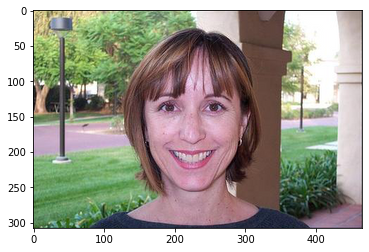

In [32]:
random_index = 75
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos');

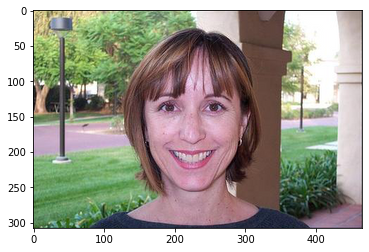

In [33]:
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos');


Above Image is nearest to the image we given to search, because Our algorithm search the distance(Euclidean distance), which eventually gives nearest in this case nearest is the same image we have given for search.
 so we will try with other index to indices.

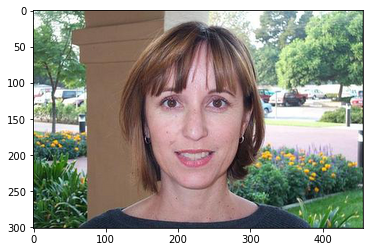

In [34]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos');


Now we can see the image, which is isn't duplicate but similar to the original search image as appeared.

In [35]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
        # To save the plot in a high definition format i.e. PDF, uncomment the following line:
        #plt.savefig('results/' + str(random.randint(0,10000))+'.pdf', format='pdf', dpi=1000)
        # We will use this line repeatedly in our code.

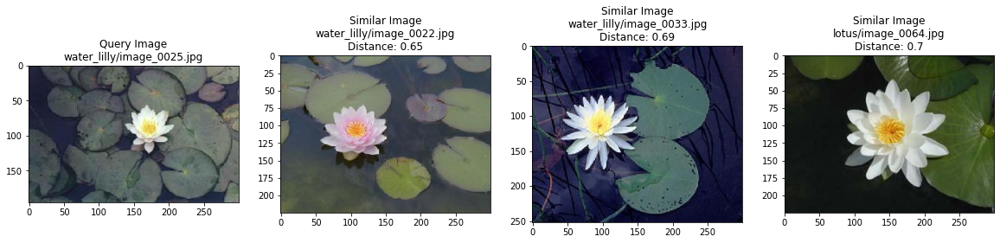

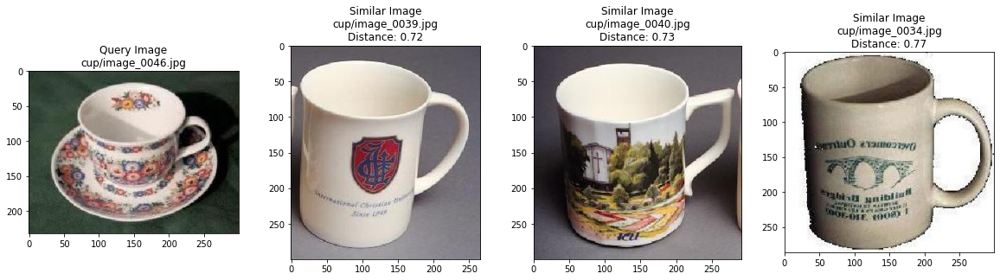

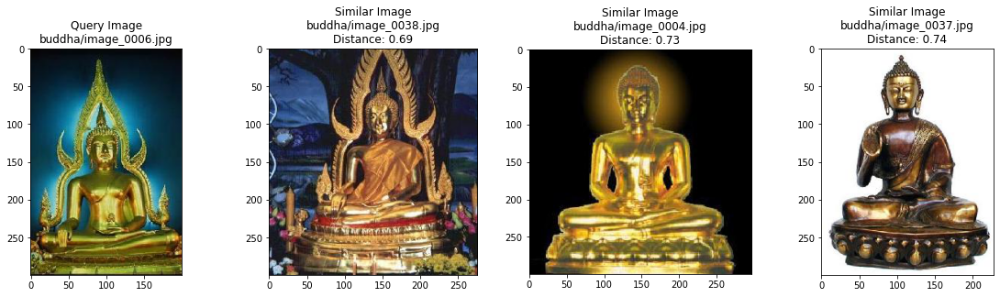

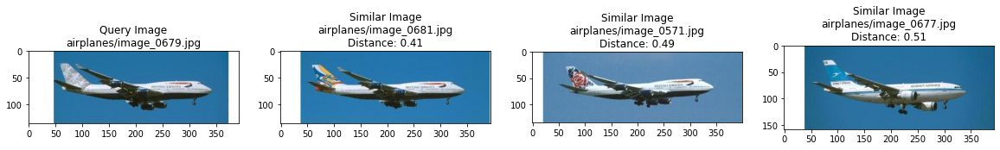

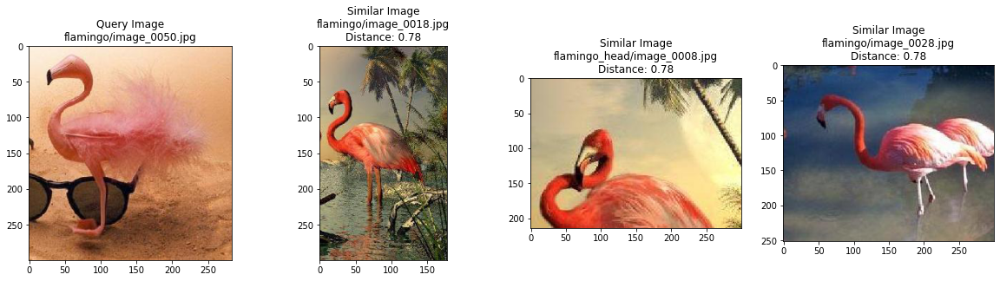

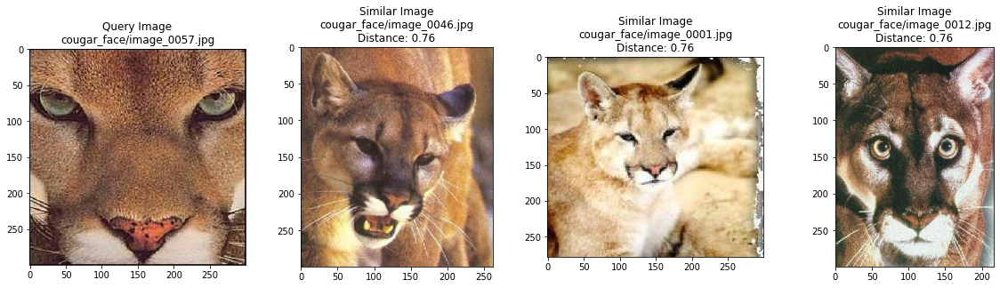

In [36]:
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])


In [37]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  1.0041636
Max distance between all photos:  1.2522099
Median distance among most similar photos:  0.65938926


In [38]:
selected_features = feature_list[:]
selected_class_ids = class_ids[:]
selected_filenames = filenames[:]

In [39]:
from sklearn.manifold import TSNE

# You can play with these values and see how the results change
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8677 samples in 0.017s...
[t-SNE] Computed neighbors for 8677 samples in 7.039s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8677
[t-SNE] Computed conditional probabilities for sample 2000 / 8677
[t-SNE] Computed conditional probabilities for sample 3000 / 8677
[t-SNE] Computed conditional probabilities for sample 4000 / 8677
[t-SNE] Computed conditional probabilities for sample 5000 / 8677
[t-SNE] Computed conditional probabilities for sample 6000 / 8677
[t-SNE] Computed conditional probabilities for sample 7000 / 8677
[t-SNE] Computed conditional probabilities for sample 8000 / 8677
[t-SNE] Computed conditional probabilities for sample 8677 / 8677
[t-SNE] Mean sigma: 0.196519
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.386749
[t-SNE] KL divergence after 1000 iterations: 1.292697
t-SNE done! Time elapsed: 70.71832799911499 seconds


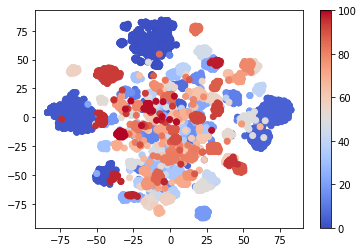

In [40]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()
# To save the plot in a high definition format i.e. PDF, uncomment the following line:
#plt.savefig('results/' + str(ADD_NAME_HERE)+'.pdf', format='pdf', dpi=1000)

In [41]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [42]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

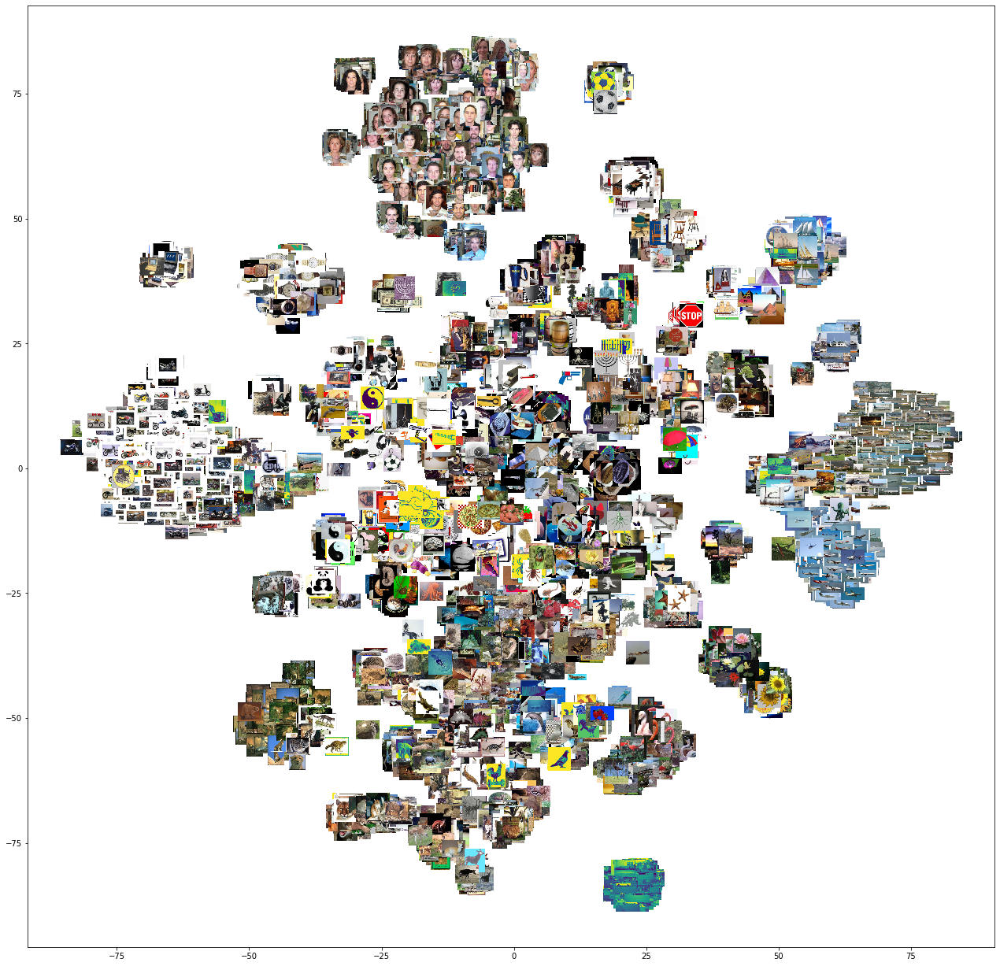

In [43]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [44]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

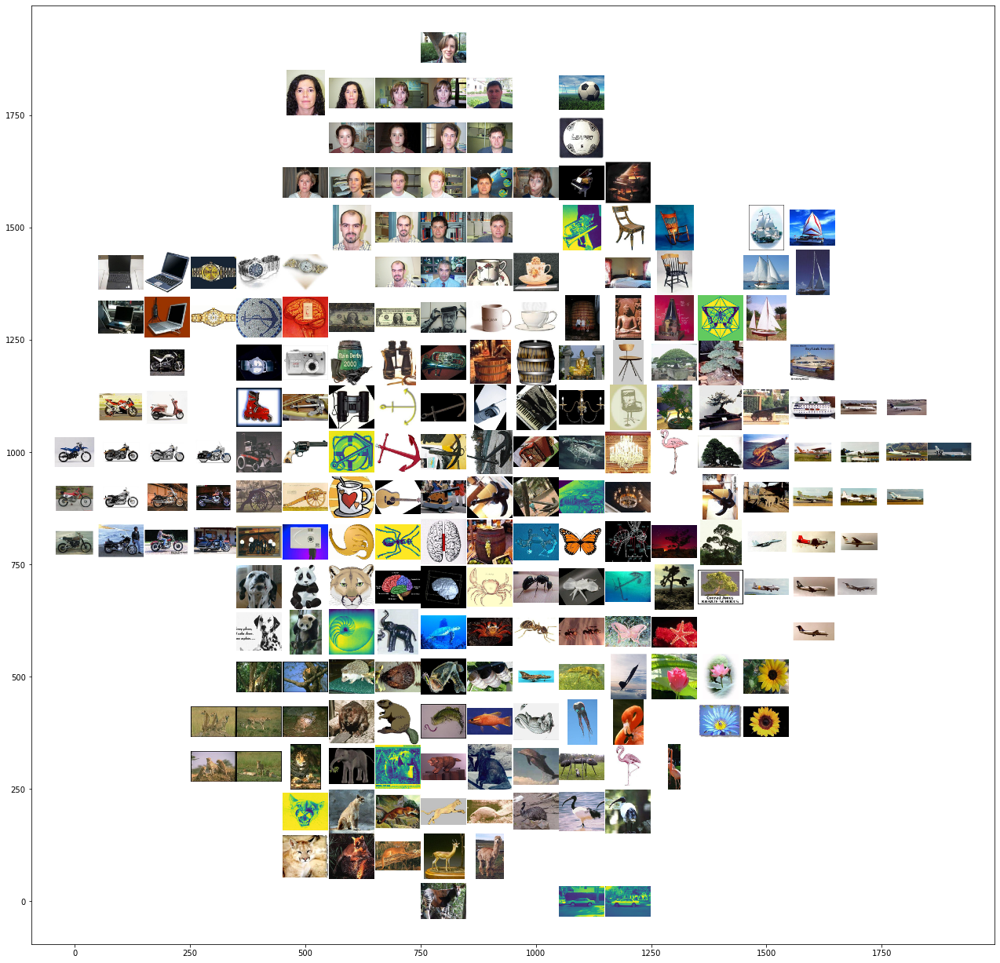

In [45]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

## PCA

In [46]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [47]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

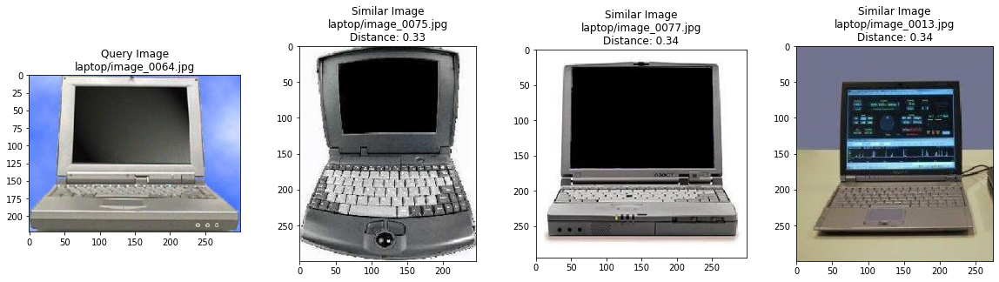

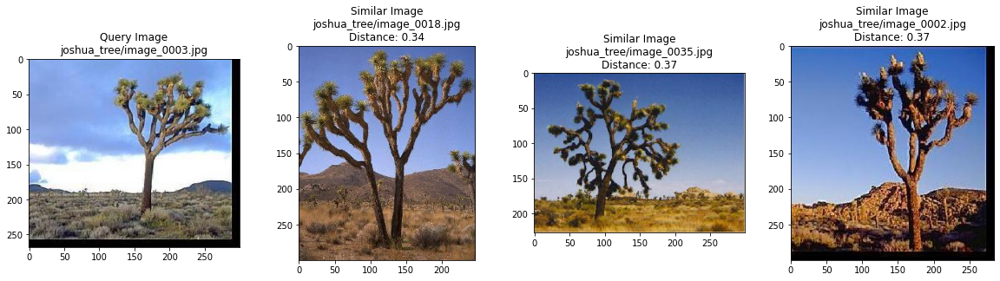

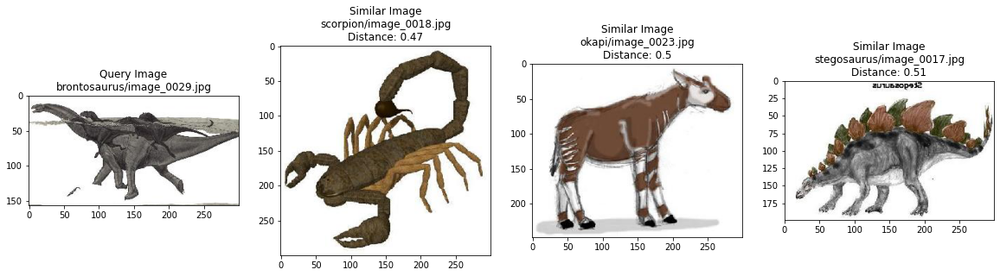

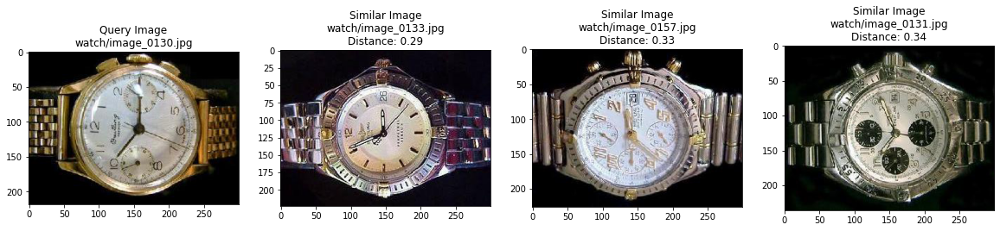

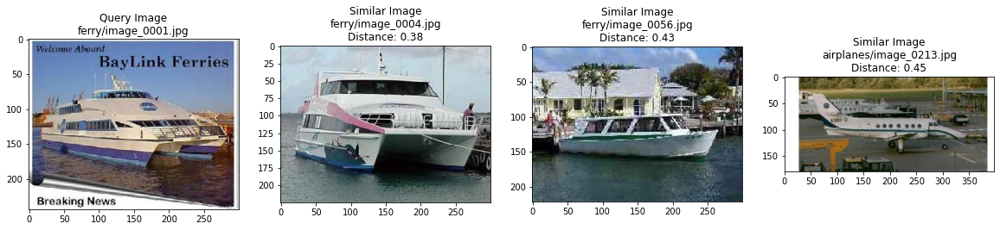

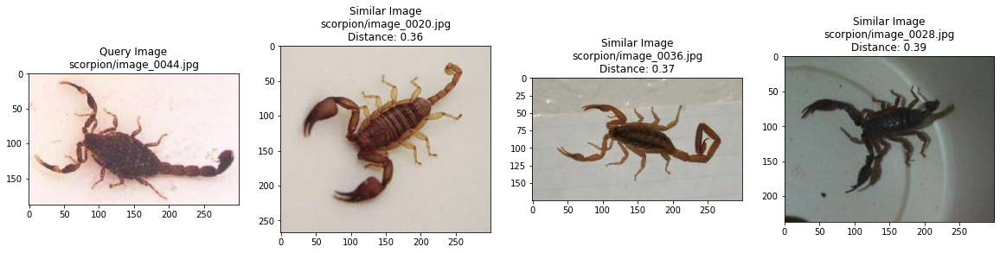

In [49]:
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [50]:
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.001s...
[t-SNE] Computed neighbors for 4000 samples in 0.361s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.143832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.845741
[t-SNE] KL divergence after 1000 iterations: 1.099836
t-SNE done! Time elapsed: 26.590490341186523 seconds


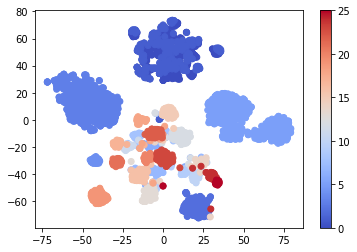

In [51]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

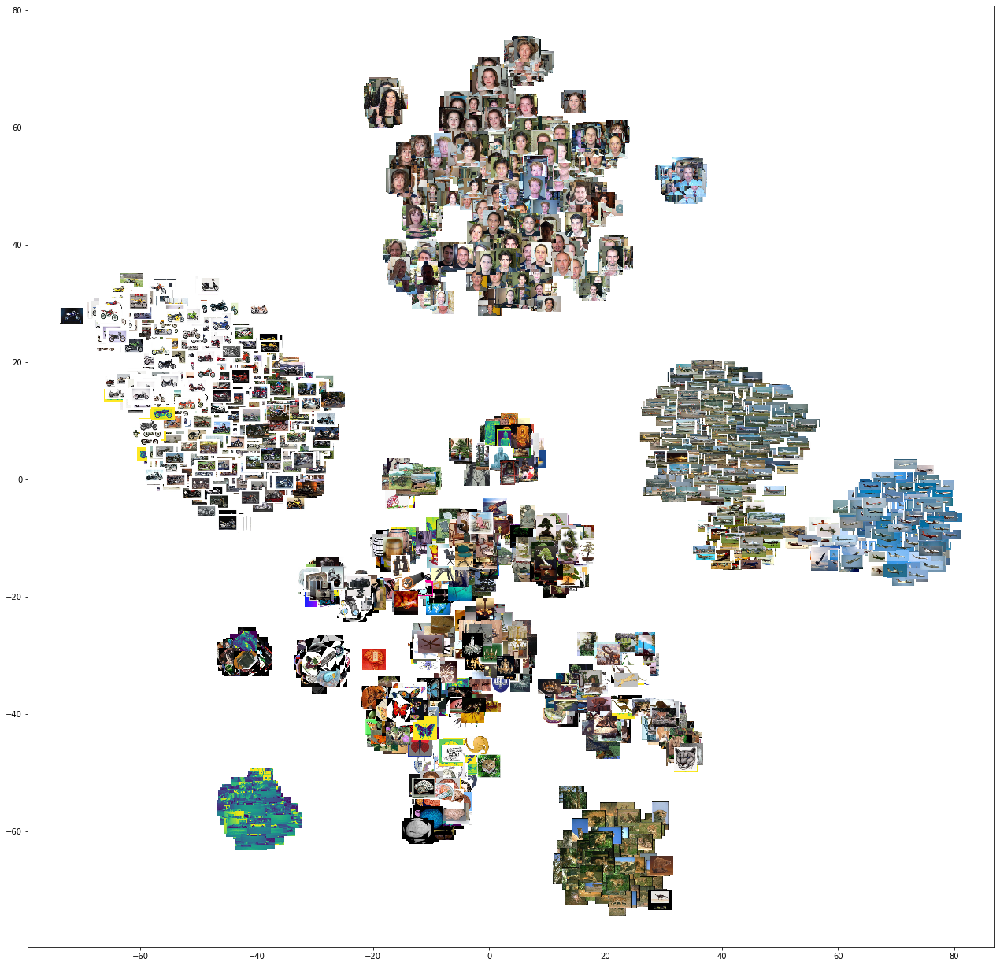

In [52]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)


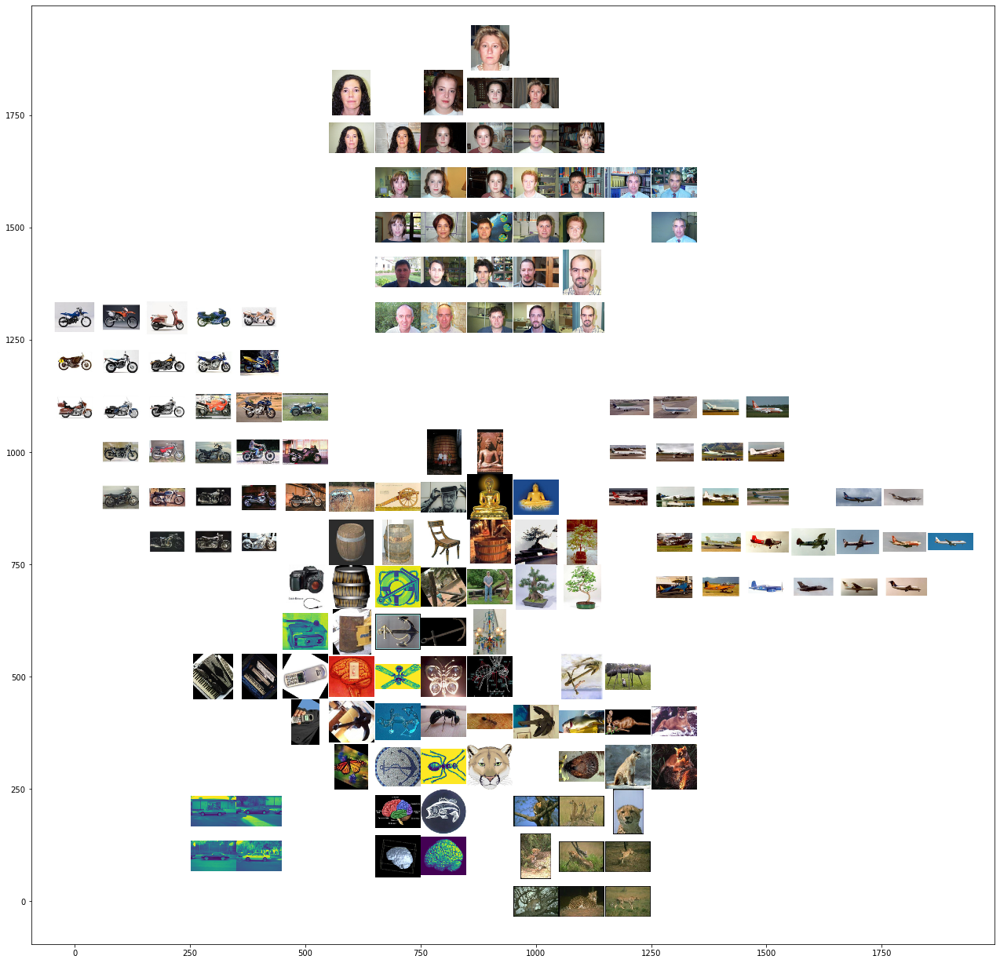

In [53]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)